In [1]:
import os 
os.chdir('../')

In [2]:
import torch
from backbones.pixart_sigma import PixArtSigma

# 사용 예
model = PixArtSigma()
print(model)

/home/scpark/miniconda3/envs/sana/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/home/scpark/miniconda3/envs/sana/lib/python3.10/site-packages/xformers/ops/fmha/flash.py:211: FutureWarning: `torch.library.impl_abstract` was renamed to `torch.library.register_fake`. Please use that instead; we will remove `torch.library.impl_abstract` in a future version of PyTorch.
  @torch.library.impl_abstract("xformers_flash::flash_fwd")
/home/scpark/miniconda3/envs/sana/lib/python3.10/site-packages/xformers/ops/fmha/flash.py:344: FutureWarning: `torch.library.impl_abstract` was renamed to `torch.library.register_fake`. Please use that instead; we will remove `torch.library.impl_abstract` in a future version of PyTorch.
  @torch.library.impl_abstract("xformers_flash::flash_bwd")
Loading pipeline components...: 100%

In [3]:
import matplotlib.pyplot as plt

def show_compare(imgs):
    fig, axes = plt.subplots(1, len(imgs), figsize=(18, 10))
    for i in range(len(imgs)):
        axes[i].imshow(imgs[i]); axes[i].axis('off')
    plt.tight_layout()
    plt.show()


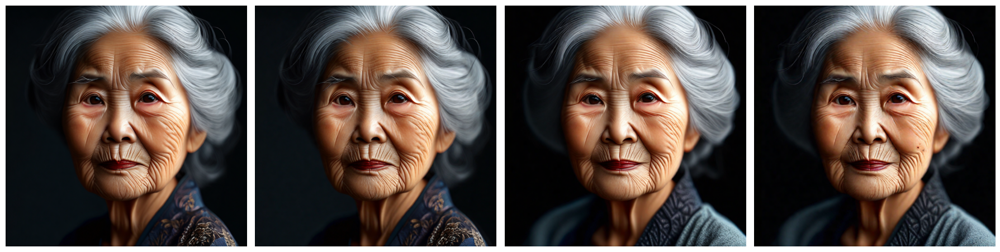

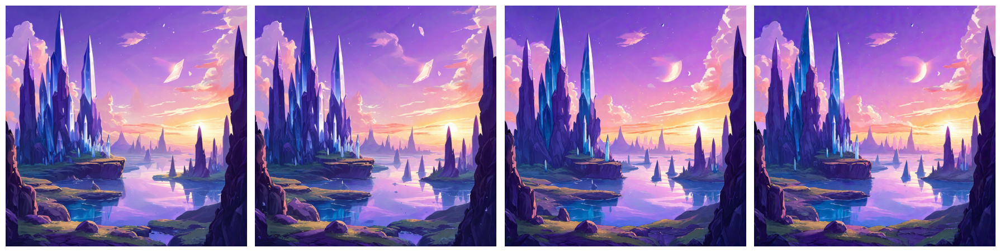

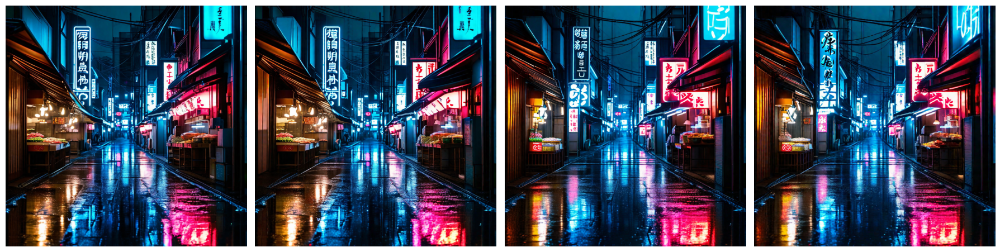

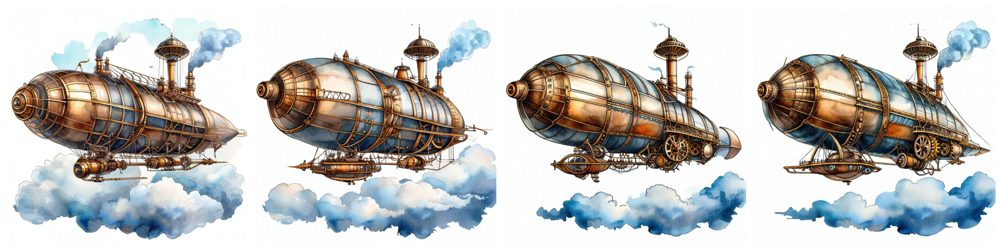

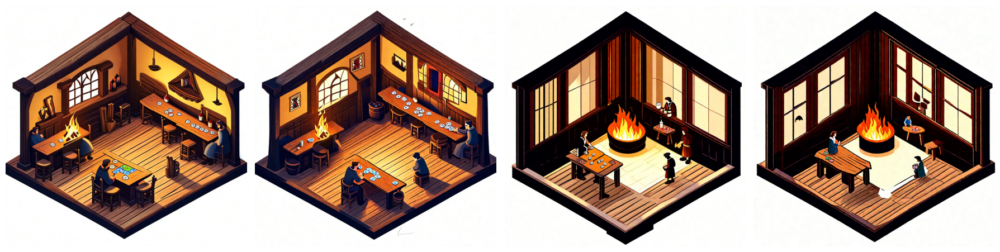

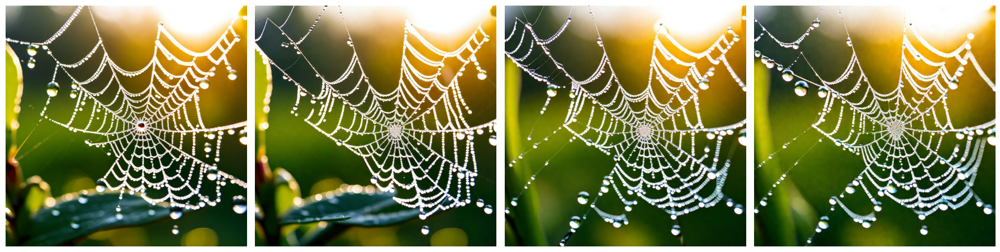

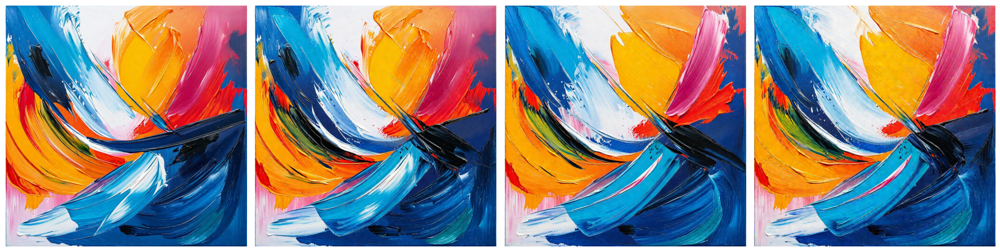

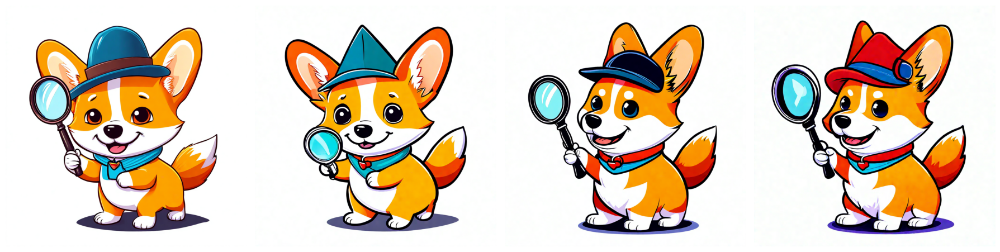

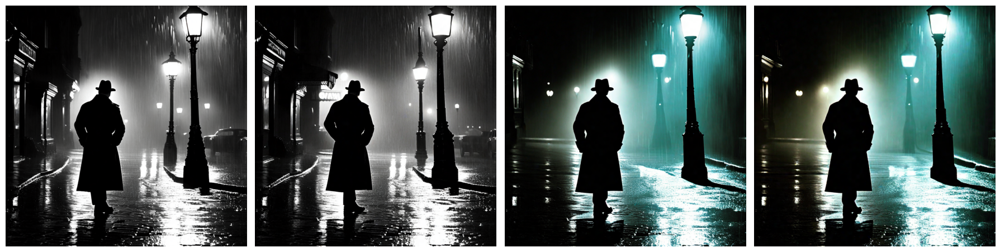

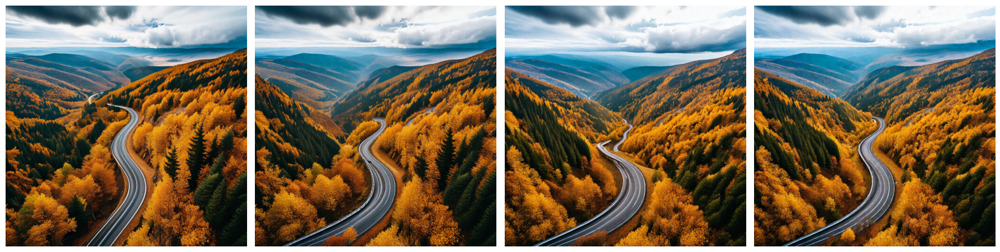

In [17]:
from solvers.euler_solver import Euler_Solver
from solvers.dpm_solver import DPM_Solver
from solvers.adams_solver import Adams_Solver
from solvers.adams_dual_solver import Adams_Dual_Solver

prompts = [
    "A photorealistic portrait of an elderly Asian woman with silver hair and deep wrinkles, soft studio lighting, 8K resolution",
    "A fantasy landscape with towering crystal spires, floating islands, and a purple sunset sky, in the style of studio ghibli",
    "A futuristic cyberpunk street market at night, neon signs in Japanese kanji, wet pavement reflecting lights, cinematic atmosphere",
    "A detailed illustration of a steampunk airship flying above the clouds, brass gears and pipes visible, watercolor painting style",
    "An isometric view of a cozy medieval tavern interior, wooden beams, roaring fireplace, characters playing dice",
    "A macro shot of a dew-covered spider web glistening in the early morning light, extreme close-up, bokeh background",
    "An abstract expressionist painting of swirling colors and shapes, evoking emotion rather than form, thick brush strokes",
    "A cartoon-style illustration of a cheerful corgi wearing a detective hat and holding a magnifying glass, vibrant colors",
    "A high-contrast black-and-white film noir scene: a trench-coated detective under a streetlamp in the rain, moody shadows",
    "An ultra-wide aerial view of a winding mountain road through autumn forest, golden leaves, dramatic clouds overhead"
]

for i in range(len(prompts)):
    pos_texts = [prompts[i]]
    neg_texts = ["lowres, bad anatomy, deformed, blurry, pixelated, oversaturated, underexposed, overexposed, artifact, jpeg artifacts, watermark, text, logo, extra limbs, mutated hands, unnatural colors, noisy background, out of focus, poor composition, cultural clichés, stereotype exaggeration, flat lighting, glitch"]

    model_fn, noise_schedule, latents = model.get_model_fn(pos_conds=pos_texts, neg_conds=neg_texts, guidance_scale=7.5, seeds=[42])

    solver = Euler_Solver(model_fn, noise_schedule, algorithm_type='data_prediction')
    euler_latents = solver.sample(latents, steps=100, skip_type='time_uniform')
    euler_samples = model.decode_vae(euler_latents)[0]

    solver = DPM_Solver(model_fn, noise_schedule, algorithm_type='data_prediction')
    dpm_latents = solver.sample(latents, steps=20, order=2, skip_type="time_uniform", method="multistep")
    dpm_samples = model.decode_vae(dpm_latents)[0]

    solver = Adams_Solver(model_fn, noise_schedule, algorithm_type='data_prediction')
    adams_latents = solver.sample(latents, steps=20, order=2, skip_type="time_uniform", method="multistep")
    adams_samples = model.decode_vae(adams_latents)[0]

    solver = Adams_Dual_Solver(model_fn, noise_schedule, algorithm_type='dual_prediction')
    adams2_latents = solver.sample(latents, steps=20, order=2, skip_type="time_uniform", method="multistep")
    adams2_samples = model.decode_vae(adams2_latents)[0]

    show_compare([euler_samples, dpm_samples, adams_samples, adams2_samples])

In [18]:
import torch.nn.functional as F
print(F.mse_loss(euler_latents, dpm_latents))
print(F.mse_loss(euler_latents, adams_latents))
print(F.mse_loss(euler_latents, adams2_latents))

tensor(0.1359, device='cuda:0')
tensor(0.2224, device='cuda:0')
tensor(0.1946, device='cuda:0')
